In [2]:
import random
import numpy as np

In [3]:
def old_generate_world_bounds(xy1 = (-1, -1), xy2 = (1, 1), orig_size = None, endP = .40, edgeT = .1):
    args = {"orig_size": orig_size,
            "endP": endP,
            "edgeT": edgeT,
            }
    x1, y1 = xy1
    x2, y2 = xy2
    bounds = set()
    if orig_size is None:
        args["orig_size"] = orig_size = abs((x2 - x1) * (y2 - y1))

    if abs((x2 - x1) * (y2 - y1)) < orig_size * endP:
        return {(xy1, xy2)}
    split = ["x","y"][random.randint(0,1)]
    if split == "x":
        x = x1
        i = 0
        while abs(x - x1) < edgeT or abs(x2 - x) < edgeT:
            if i > 500:
                return {(xy1, xy2)}
            i += 1
            x = random.uniform(x1, x2)
        bounds |= old_generate_world_bounds( xy1,   (x, y2), **args)
        bounds |= old_generate_world_bounds((x, y1), xy2,    **args)
    elif split == "y":
        y = y1
        i = 0
        while abs(y - y1) < edgeT or abs(y2 - y) < edgeT:
            if i > 500:
                return {(xy1, xy2)}
            i += 1
            y = random.uniform(y1, y2)
        bounds |= old_generate_world_bounds( xy1,   (x2, y), **args)
        bounds |= old_generate_world_bounds((x1, y), xy2,    **args)
    return bounds

In [4]:
from copy import copy
def generate_world_bounds(features, feature_bounds = (0, 1), endT = .20, endA = .40, max_depth = 100, depth = 0, current_bounds = None):
    if type(features) is int:
        features = np.arange(features)
    if type(feature_bounds) is tuple and len(feature_bounds) == 2:
        feature_bounds = [feature_bounds for _ in range(len(features))]
    if len(features) != len(feature_bounds):
        print(f"features {features} and feature_bounds {feature_bounds} not the same size")
        return
    if current_bounds is None:
        current_bounds = copy(feature_bounds)
    
    args = {"features": features,
            "feature_bounds": feature_bounds,
            "endT": endT,
            "endA": endA,
            "max_depth": max_depth,
            }
    bounds = set()

    feature = random.randint(0, len(features) - 1)
    start, end = current_bounds[feature]
    f_start, f_end = feature_bounds[feature]
    random_offset = (f_end - f_start) * endT
    start_random, end_random = start + random_offset, end - random_offset
    if end_random <= start_random or \
            depth > max_depth or \
            np.multiply.reduce([b - a for a, b in feature_bounds]) * endA > np.multiply.reduce([b - a for a, b in current_bounds]):
        return {tuple(current_bounds)}
 
    cut = random.uniform(start_random, end_random)
    
    current_bounds[feature] = (start, cut)
    bounds |= generate_world_bounds(current_bounds = copy(current_bounds), depth = depth + 1, **args)
    
    current_bounds[feature] = (cut, end)
    bounds |= generate_world_bounds(current_bounds = copy(current_bounds), depth = depth + 1, **args)
    return bounds

In [5]:
def generate_true_values(bounds_with_class, feature_bounds):
    if type(feature_bounds) is tuple and len(feature_bounds) == 2:
        feature_bounds = [feature_bounds for _ in range(len(list(bounds_with_class.items())[0][0]))]
    points = []
    for _ in range(10**4):
        val = [random.uniform(feature_bounds[i][0], feature_bounds[i][1]) for i in range(len(feature_bounds))]
        for bounds, cls in bounds_with_class.items():
            if all([start < val[i] < end for i, (start, end) in enumerate(bounds)]):
                points.append(np.array([cls] + val))
    return np.array(points)

In [6]:
def draw_true_world(data, cmap='viridis'):
    import matplotlib.pyplot as plt
    
    classes = data[:, 0]
    x = data[:, 1]
    y = data[:, 2]

    plt.figure(figsize=(8, 8))
    plt.scatter(x, y, c=classes, cmap=cmap, edgecolor='k')
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.title('Scatter Plot of Points by Class')
    plt.show()

In [7]:
def draw_observed_world(data, cmap='viridis'):
    import matplotlib.pyplot as plt
    
    x = data[:, 3]
    y = data[:, 5]
    classes = data[:, 0]

    plt.figure(figsize=(8, 8))
    plt.scatter(x, y, c=classes, cmap=cmap, edgecolor='k')
    plt.xlabel('X-axis')
    plt.ylabel('Y-axis')
    plt.title('Scatter Plot of Points by Class')
    plt.show()

In [8]:
def draw_combined_world(data, sample_data = None, cmap='viridis'):
    import matplotlib.pyplot as plt
    
    # Extracting data for the true world
    true_classes = data[:, 0]
    true_f1 = data[:, 1]
    true_f2 = data[:, 2]
    
    # Extracting data for the observed worlds
    obs_f1 = data[:, 3]
    obs_f2 = data[:, 5]
    
    if sample_data is not None:
        obs_samp_classes = sample_data[:, 0]
        obs_samp_f1 = sample_data[:, 3]
        obs_samp_f2 = sample_data[:, 5]
    
    # Creating subplots
    fig, axs = plt.subplots(1, 3 if sample_data is not None else 2, figsize=(24 if sample_data is not None else 16, 8))
    
    # True World
    axs[0].scatter(true_f1, true_f2, c=true_classes, cmap=cmap, edgecolor='k')
    axs[0].set_xlabel('Feature 1')
    axs[0].set_ylabel('Feature 2')
    axs[0].set_title('True World')
    
    # Observed World
    axs[1].scatter(obs_f1, obs_f2, c=true_classes, cmap=cmap, edgecolor='k')
    axs[1].set_xlabel('Feature 1')
    axs[1].set_ylabel('Feature 2')
    axs[1].set_title('Observed World')
    
    if sample_data is not None:
        # Observed World Sampled
        axs[2].scatter(obs_samp_f1, obs_samp_f2, c=obs_samp_classes, cmap=cmap, edgecolor='k')
        axs[2].set_xlabel('Feature 1')
        axs[2].set_ylabel('Feature 2')
        axs[2].set_title('Observed World Sampled')
    
    # Display the plot
    plt.show()

In [9]:
def draw_world_grid(world_coords, feature_bounds):
    import matplotlib.pyplot as plt
    from matplotlib.patches import Rectangle
    
    
    fig = plt.figure(figsize=(5, 4.5))
    ax = fig.add_subplot(111)

    plt.title("Rectangles")
    for (_x1, _x2), (_y1, _y2) in world_coords:
        rect1 = Rectangle((_x1, _y1), abs(_x2 - _x1), abs(_y2 - _y1), color = 'orange', fc = 'none', lw = 2)
        ax.add_patch(rect1)

    plt.xlim(feature_bounds[0])
    plt.ylim(feature_bounds[1])

    plt.show()

In [10]:
corr_dict = {
    0.57: -0.25,
    0.60: -0.1,
    0.65: 0, 
    0.70: 0.065,
    0.75: 0.135,
    0.80: 0.215,
    0.85: 0.305,
    0.90: 0.41,
    0.95: 0.56,
    1: 1, 
}
def add_unc(tv, errRange = 1, corr = 1):
    err = errRange * random.random() * [-1,+1][random.randint(0,1)]
    ov = tv + err * random.uniform(corr_dict[corr] , 1)
    unc = abs(err)
    return ov, unc

In [11]:
def data_to_world(data, errRange = 1, corr = 1):
    _, n_feat = data.shape
    n_feat -= 1
    args = {
        "errRange": errRange,
        "corr" : corr
    }
    arr = []
    i = 0
    arr.append(data[:, i])
    i += 1
    for _ in range(n_feat):
        arr.append(data[:, i])
        i += 1

    for i in range(n_feat):
        ovunc = np.array([add_unc(tv, **args) for tv in data[:, i + 1]])
        arr.append(ovunc[:, 0]) 
        arr.append(ovunc[:, 1])

    #True Value 1, True Value 2, Class, Observed Value 1, Uncertainty 1, Observed Value 2, Uncertainty 2
    return np.stack(arr, axis=1)

In [12]:
def sample_data(data, sample_per_class = 20):
    for i, value in enumerate(np.unique(data[:, 0])):
        indices, = np.where(data[:, 0] == value)
        data_per_class = data[indices]
        bagged_data_class = data_per_class[np.random.choice(len(data_per_class), size=sample_per_class, replace=False)]
        if i == 0:
            bagged_data = bagged_data_class
        else:
            bagged_data = np.concatenate((bagged_data, bagged_data_class))
    return bagged_data

In [13]:
def generate_world(seed, features, feature_bounds = (0, 1), endT = .2, endA = .1, max_depth = 4, class_number = 2, errRange = 0.1, corr = 1):
    random.seed(seed) # 2427
    world_coords = generate_world_bounds(features = features, feature_bounds = feature_bounds, endT = endT, endA = endA, max_depth = max_depth)
    bounds_with_class = {}
    random_list = list(np.arange(class_number)) + [random.randint(0, class_number - 1) for _ in range(len(world_coords) - class_number)]
    np.random.shuffle(random_list)
    for i, bounds in zip(random_list, world_coords):
        bounds_with_class[bounds] = i
    data = generate_true_values(bounds_with_class, feature_bounds)
    
    return data_to_world(data, errRange = errRange, corr = corr)

4428


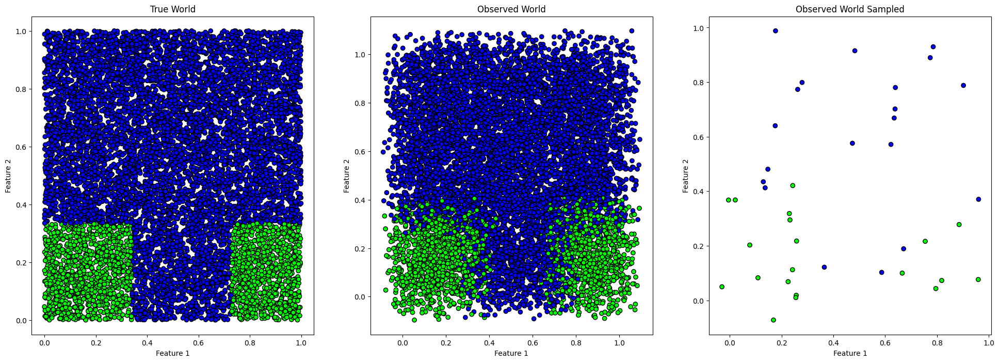

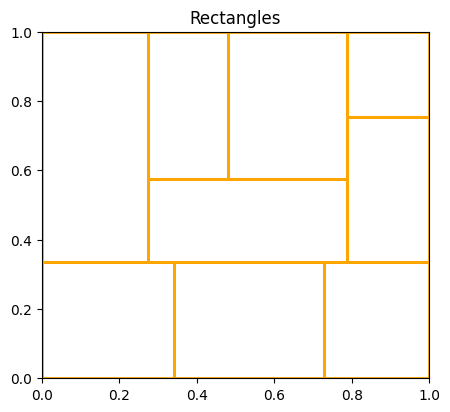

In [14]:
seed = random.randint(0, 10000)
print(seed)
random.seed(2427) # 2427
feature_bounds = [(0, 1), (0, 1)]
world_coords = generate_world_bounds(features = 2, feature_bounds = feature_bounds, endT = .2, endA = .1, max_depth = 4)
bounds_with_class = {}
# seed(None)
for i, bounds in enumerate(world_coords):
    bounds_with_class[bounds] = random.randint(0, 1)

data = generate_true_values(bounds_with_class, feature_bounds)

#Class, True Value 1, True Value 2, Observed Value 1, Uncertainty 1, Observed Value 2, Uncertainty 2
world = data_to_world(data, errRange = 0.1, corr = 1)

# draw_true_world(world, "brg")
# draw_observed_world(world, "brg")
# random.seed(None)
# draw_observed_world(sample_data(world), "brg")
np.random.seed(2427)
draw_combined_world(world, sample_data(world), "brg")
draw_world_grid(world_coords, feature_bounds)

In [15]:
import pandas as pd 
  
df = pd.DataFrame(world, columns=["True Value 1", "True Value 2", "Class", "Observed Value 1", "Uncertainty 1", "Observed Value 2", "Uncertainty 2"]) 

df
# df.to_csv(f"../data/2_feature/worlds/seed22/errR({0.2})_corr({.6}).csv")

,True Value 1,True Value 2,Class,Observed Value 1,Uncertainty 1,Observed Value 2,Uncertainty 2
0,1.0,0.057032,0.128001,0.069745,0.012713,0.099756,0.028246
1,0.0,0.825050,0.454439,0.879180,0.054131,0.546554,0.092114
2,0.0,0.038480,0.661231,0.010010,0.028470,0.715358,0.054127
3,0.0,0.953030,0.790760,0.892691,0.060339,0.887304,0.096544
4,1.0,0.056784,0.083428,0.076315,0.019531,0.108535,0.025106
...,...,...,...,...,...,...,...
9995,0.0,0.506322,0.475683,0.545278,0.038955,0.526692,0.051009
9996,1.0,0.918795,0.025469,0.893192,0.025603,-0.051875,0.077344
9997,1.0,0.814592,0.254392,0.840401,0.025808,0.353968,0.099576
9998,0.0,0.000547,0.988356,-0.022159,0.022705,1.064096,0.075739


In [16]:

def plot_combined_3d(world, cmap='viridis'):
    import matplotlib.pyplot as plt
    # Extracting data for the first 3D plot
    classes_3d_1 = world[:, 0]
    f1_1 = world[:, 1]
    f2_1 = world[:, 2]
    f3_1 = world[:, 3]

    # Extracting data for the second 3D plot
    classes_3d_2 = world[:, 0]
    f1_2 = world[:, 4]
    f2_2 = world[:, 6]
    f3_2 = world[:, 8]

    # Creating subplots
    fig = plt.figure(figsize=(20, 8))

    # First 3D Plot
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.scatter(f1_1, f2_1, f3_1, c=classes_3d_1, cmap=cmap, edgecolor='k')
    ax1.set_xlabel('Feature 1')
    ax1.set_ylabel('Feature 2')
    ax1.set_zlabel('Feature 3')
    ax1.set_title('True World')

    # Second 3D Plot
    ax2 = fig.add_subplot(122, projection='3d')
    ax2.scatter(f1_2, f2_2, f3_2, c=classes_3d_2, cmap=cmap, edgecolor='k')
    ax2.set_xlabel('Feature 1')
    ax2.set_ylabel('Feature 2')
    ax2.set_zlabel('Feature 3')
    ax2.set_title('Observed world')

    # Display the combined plots
    plt.show()

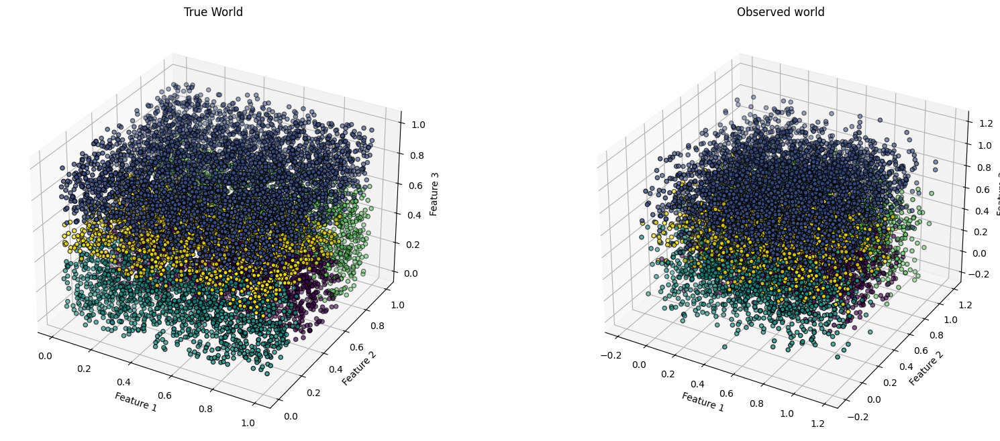

In [17]:
import matplotlib.pyplot as plt
feature_bounds = (0, 1)
world_coords = generate_world_bounds(features = 3, feature_bounds = feature_bounds, endT = .2, endA = .20,  max_depth = 3)
bounds_with_class = {}

for i, bounds in enumerate(world_coords):
    bounds_with_class[bounds] = i

data = generate_true_values(bounds_with_class, feature_bounds)

world = data_to_world(data, errRange = 0.2, corr = 1)

plot_combined_3d(world)

## Testing 

In [18]:
def plot_3d_world(world, cmap='viridis'):
    import matplotlib.pyplot as plt
    
    # Extracting data for the 3D plot
    classes_3d = world[:, 0]
    f1 = world[:, 1]
    f2 = world[:, 2]
    f3 = world[:, 3]

    # Creating subplots with different viewing angles
    fig = plt.figure(figsize=(20, 8))

    # First 3D Plot - Default view
    ax1 = fig.add_subplot(121, projection='3d')
    ax1.scatter(f1, f2, f3, c=classes_3d, cmap=cmap, edgecolor='k')
    ax1.set_xlabel('Feature 1')
    ax1.set_ylabel('Feature 2')
    ax1.set_zlabel('Feature 3')
    ax1.set_title('True World - Default View')

    # Second 3D Plot - Different view angle
    ax2 = fig.add_subplot(122, projection='3d')
    ax2.scatter(f1, f2, f3, c=classes_3d, cmap=cmap, edgecolor='k')
    ax2.set_xlabel('Feature 1')
    ax2.set_ylabel('Feature 2')
    ax2.set_zlabel('Feature 3')
    ax2.set_title('True World - Rotated View')
    ax2.view_init(elev=30., azim=120)  # Changing the elevation and azimuth

    # Display the combined plots
    plt.show()

In [19]:
def draw_world_from_seed(seed, features, NUMBER_OF_CLASSES, endT = .2, endA = .3, max_depth = 4):
    np.random.seed(seed)
    world = generate_world(seed, features, 
                           feature_bounds = feature_bounds, 
                           endT = endT, endA = endA, max_depth = max_depth,
                           class_number = NUMBER_OF_CLASSES,
                           errRange = 1, corr = 1)
    if features == 3:
        plot_3d_world(world)
    else:
        draw_true_world(world)

In [20]:
from Orange.data import Table, Domain, ContinuousVariable, DiscreteVariable

def sample_data_orange(data, samples_per_class = 20):
    for i, value in enumerate(np.unique(data.Y)):
        indices, = np.where(data.Y == value)
        data_per_class = data[indices]
        sampled_data_class = data_per_class[np.random.choice(len(data_per_class), size=samples_per_class, replace=False)]
        if i == 0:
            sampled_data = sampled_data_class
        else:
            sampled_data = Table.concatenate((sampled_data, sampled_data_class))
    return sampled_data

def convert_np_to_orange(world, number_features):
    
    columns = ["Class"] + [f"True Value {feature}" for feature in range(1, number_features + 1)]
    for feature in range(1, number_features + 1):
        columns += [f"Observed Value {feature}", f"Uncertainty {feature}"]
            
    world = pd.DataFrame(world, columns=columns) 
    
    world["Class"] = world["Class"].astype(int)

    X = np.column_stack([world[f"Observed Value {i+1}"] for i in range(number_features)])
    Y = np.array(world["Class"])
    M = np.column_stack([world[f"Uncertainty {i+1}"] for i in range(number_features)])
    Xtv = np.column_stack([world[f"True Value {i+1}"] for i in range(number_features)])
    
    domain = Domain(
        attributes = [ContinuousVariable(f"Observed Value {i+1}") for i in range(number_features)],
        class_vars = DiscreteVariable("Class", values=[str(i) for i in range(max(Y+1))]),
        metas = [ContinuousVariable(f"Uncertainty {i+1}") for i in range(number_features)]
    )
    data = Table.from_numpy(domain, X=X, Y=Y, metas=M)
    
    domain = Domain(
        attributes = [ContinuousVariable(f"Observed Value {i+1}") for i in range(number_features)],
        class_vars = DiscreteVariable("Class", values=[str(i) for i in range(max(Y+1))])
    )
    # X = tv1.reshape(-1, 1)
    test_data = Table.from_numpy(domain, X=Xtv, Y=Y)
    return data, test_data

In [21]:
from trees.util.uncertaintreelearner import UncertainTreeLearner
from trees.util.uncertainforestutil import UncertainForestLearner
from trees.owtree import ClassificationTreeLearner
from Orange.modelling import RandomForestLearner
from Orange.classification.logistic_regression import LogisticRegressionLearner

post_hoc = UncertainTreeLearner(max_depth=None, min_samples_leaf=2, min_samples_split=4, sufficient_majority=0.90, post_hoc=True)
skl_tree = ClassificationTreeLearner(max_depth=None, min_samples_leaf=2, min_samples_split=4, sufficient_majority=0.90)
uncertain_forest = UncertainForestLearner(n_trees=10, max_depth=None, min_samples_split=4)
random_forest = RandomForestLearner(n_trees=10, max_depth=None, min_samples_split=4, max_features = None)
lasso = LogisticRegressionLearner(penalty="l1")
ridge = LogisticRegressionLearner(penalty="l2")


In [22]:
from Orange.evaluation import TestOnTestData
from Orange.evaluation.scoring import CA

def get_world_results(seed, features, errRange, NUMBER_OF_CLASSES, n_sample, rep): 
    results = []
    for err_range in errRange:
        print(f"  World Seed {seed}, errRange {err_range}")
        np.random.seed(seed)
        world = generate_world(seed, features, 
                            feature_bounds = feature_bounds, 
                            endT = .2, endA = .3, max_depth = 4,
                            class_number = NUMBER_OF_CLASSES,
                            errRange = err_range, corr = 1)
        data, test_data = convert_np_to_orange(world, features)
        for samples_per_class in n_sample:
            average_CA = np.array([0, 0, 0], dtype="float64")
            for _ in range(rep):
                res = TestOnTestData(data=sample_data_orange(data, samples_per_class), test_data=test_data, learners=[skl_tree, post_hoc, uncertain_forest])
                average_CA += CA(res)
                # print(sample_data_orange(data, samples_per_class))
                # print(f"    samples_per_class: {samples_per_class}\n    Results:")
            average_CA = average_CA / rep * 100
            results.append([features, seed, err_range, samples_per_class, average_CA[0], average_CA[1], average_CA[2]])
            # print(f"  Results {samples_per_class}:\n      skl_tree          {round(average_CA[0], 2)}%\n      post_hoc          {round(average_CA[1], 2)}%\n      uncertain_forest  {round(average_CA[2], 2)}%")
    return results
            

In [23]:
from IPython.core.display import HTML

# Custom CSS to change the background color of the progress bar
display(HTML("""
    <style>
        .progress .progress-bar {
            background-color: #f60 !important; /* Change the progress bar background color to black */
        }
    </style>
"""))


In [ ]:
import numpy as np
from concurrent.futures import as_completed, ProcessPoolExecutor
from Orange.evaluation import TestOnTestData
from Orange.evaluation.scoring import CA
from tqdm.notebook import tqdm


feature_bounds = (0, 1)
n_feat = [2, 1, 3]
n_worlds = 10
n_sample = [5, 10, 20, 40]
rep = 33
errRange = list(np.arange(0, 11) / 10)
NUMBER_OF_CLASSES = 2
endT=.2
endArea = [.1, .2, .3]
max_depth=4
learners = [post_hoc, skl_tree, uncertain_forest, random_forest, lasso, ridge]

# Function to be executed in parallel
def run_experiment(features, world_gen_seed, err_range, n_sample, learners, endA = .2):
    np.random.seed(world_gen_seed)
    world = generate_world(world_gen_seed, features, 
                           feature_bounds=feature_bounds, 
                           endT=endT, endA=endA, max_depth=max_depth,
                           class_number=NUMBER_OF_CLASSES,
                           errRange=err_range, corr=1)
    data, test_data = convert_np_to_orange(world, features)
    results = []
    for samples_per_class in n_sample:
        for _ in range(rep):
            res = TestOnTestData(data=sample_data_orange(data, samples_per_class), 
                                test_data=test_data, 
                                learners=learners)
            results.append([features, world_gen_seed, err_range, samples_per_class] + [val for val in CA(res)])                    
    return results

# Main execution block
results = []

feat_PB = tqdm(total=n_worlds*len(errRange))
for endA in endArea:
    for features in n_feat:
        feat_PB.set_description(desc=f"{features} Feat endArea {endA}")
        feat_PB.reset()
        # for i in tqdm(range(100), desc="Feature:"):
        #     time.sleep(1)
        with ProcessPoolExecutor() as executor:
            futures = []
            for world_gen_seed in range(n_worlds):
                for err_range in errRange:
                    futures.append(executor.submit(run_experiment, features, world_gen_seed, err_range, n_sample, learners, endA))
            
            for future in as_completed(futures):
                results += future.result()
                feat_PB.update()

        df = pd.DataFrame(results, columns=["Features", "World", "errRange", "n_samples", "skl", "post_hoc", "uncertain_forest", "random_forest", "lasso", "ridge"])
        df.to_csv(f"results{features}feat_{n_worlds}worlds_{endA}endA.csv", index=False)
        results = []

# Process results as needed


  0%|          | 0/110 [00:00<?, ?it/s]

[0.9432 0.9432 0.944  0.7979 0.7539 0.7478]
[0.2814 0.2809 0.5653 0.5424 0.7539 0.3784][0.6506 0.6328 0.6028 0.564  0.7539 0.7539]

[0.3796 0.336  0.3677 0.3853 0.7539 0.3232]
[0.3256 0.3086 0.3633 0.4728 0.7539 0.3588]
[0.364  0.3276 0.3485 0.3911 0.7539 0.341 ]
[0.3398 0.3232 0.385  0.382  0.7539 0.3064]
[0.6084 0.6694 0.464  0.5823 0.7539 0.2877]
[0.9271 0.8903 0.9289 0.7884 0.7539 0.7418]
[0.7539 0.7539 0.7539 0.4602 0.7539 0.6515]
[0.7539 0.7539 0.7539 0.5055 0.7539 0.6421]
[0.7539 0.7539 0.7539 0.3943 0.7539 0.6346]
[0.8597 0.8597 0.9076 0.6516 0.7539 0.6128]
[0.6019 0.5811 0.8748 0.6771 0.7539 0.6089][0.7539 0.7539 0.7539 0.3518 0.7539 0.6267]

[0.8822 0.827  0.7489 0.7702 0.7539 0.7359]
[0.8125 0.721  0.6981 0.7068 0.7539 0.7283]
[0.729  0.713  0.729  0.3364 0.7539 0.6208][0.3624 0.3624 0.434  0.675  0.6833 0.5327][0.7376 0.6744 0.6816 0.5041 0.7539 0.6149]

[0.4988 0.5004 0.2857 0.3345 0.2931 0.5183]
[0.7376 0.6542 0.7029 0.4529 0.7539 0.6164]

[0.7539 0.7539 0.6076 0.2872 0.3

KeyboardInterrupt: 

[0.3228 0.4865 0.3585 0.4108 0.7539 0.6962]


[0.9333 0.8987 0.9333 0.8474 0.7539 0.7646]
[0.5894 0.4715 0.558  0.5093 0.7539 0.5435][0.8689 0.8436 0.886  0.8056 0.7539 0.7387]

[0.8343 0.8343 0.8254 0.7819 0.6833 0.6834][0.6699 0.5055 0.7024 0.6217 0.6723 0.6647][0.9601 0.9601 0.9641 0.9035 0.5551 0.769 ]


[0.4763 0.3609 0.3907 0.3628 0.7539 0.6871]
[0.7427 0.5745 0.7297 0.5754 0.7539 0.6683][0.7214 0.7079 0.7214 0.7079 0.6547 0.7411]
[0.5921 0.6916 0.6066 0.5766 0.6444 0.6003]
[0.7539 0.5992 0.7539 0.3162 0.7539 0.5637]

[0.5869 0.5451 0.5713 0.5214 0.6477 0.716 ]
[0.6506 0.5428 0.6871 0.6113 0.6725 0.659 ]
[0.7231 0.6365 0.724  0.6576 0.6576 0.6605]
[0.5458 0.5013 0.5433 0.5486 0.4136 0.5305][0.9087 0.9178 0.9007 0.7845 0.7539 0.6627]

[0.7049 0.6713 0.7407 0.554  0.7539 0.7143]
[0.6282 0.5997 0.6297 0.4043 0.7539 0.6842]
[0.6335 0.506  0.6824 0.6245 0.6725 0.66  ]
[0.6842 0.6557 0.6875 0.6528 0.67   0.7389][0.7263 0.49   0.7256 0.3824 0.7539 0.6668]

[0.7342 0.7674 0.7081 0.6344 0.581  0.672 ][0.7539 0.6317 0.7492 0.5621 0.7

1320

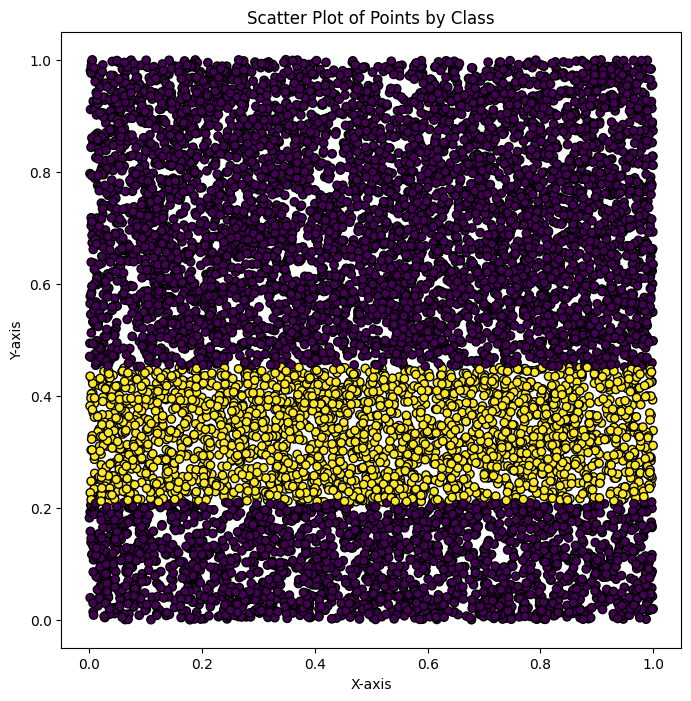

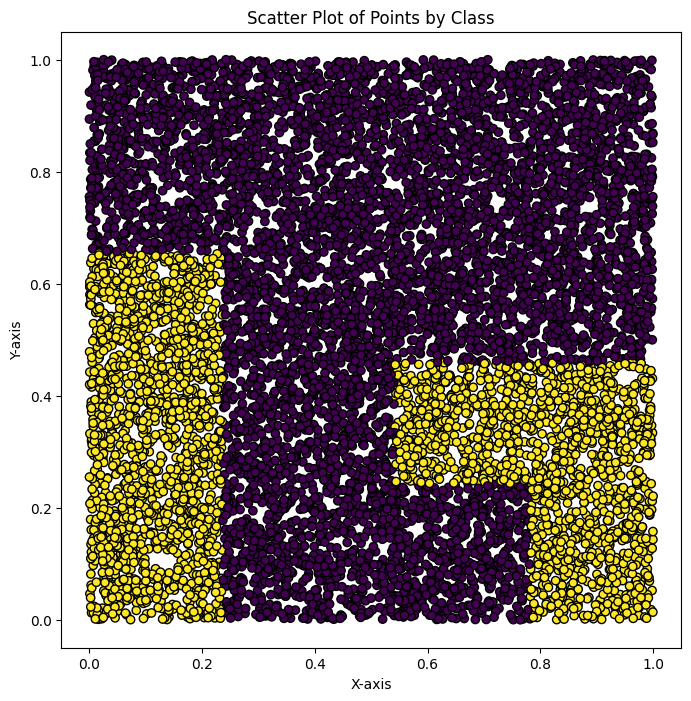

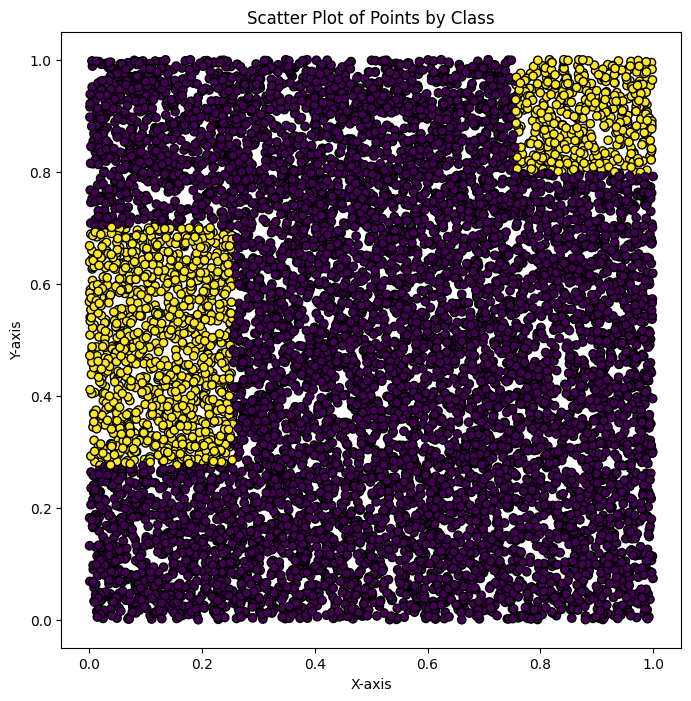

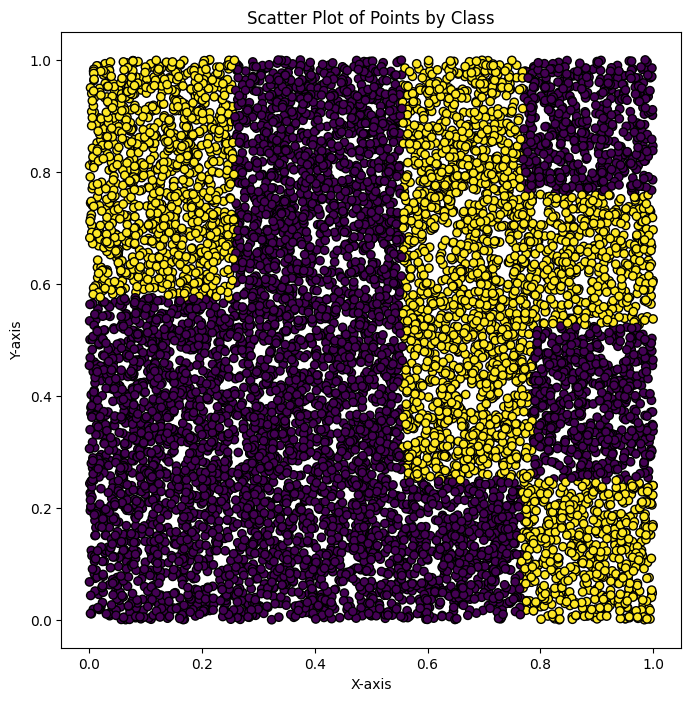

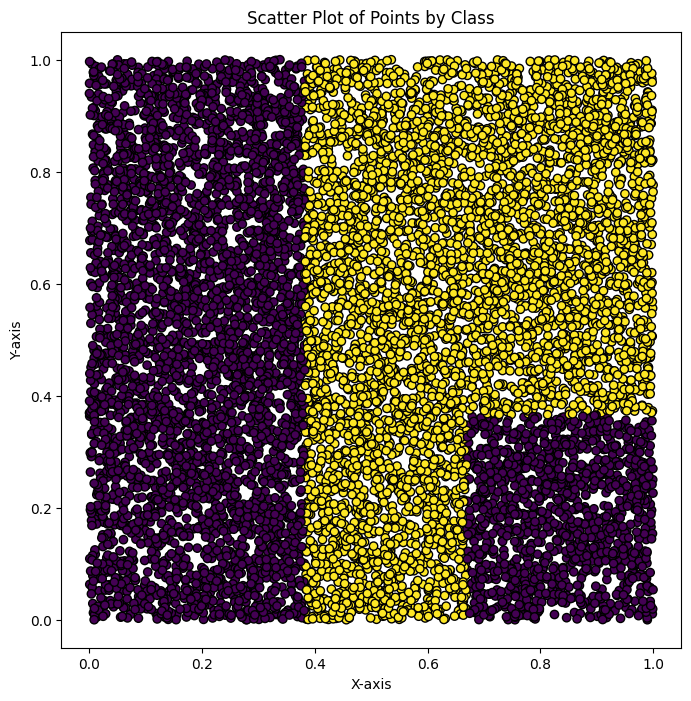

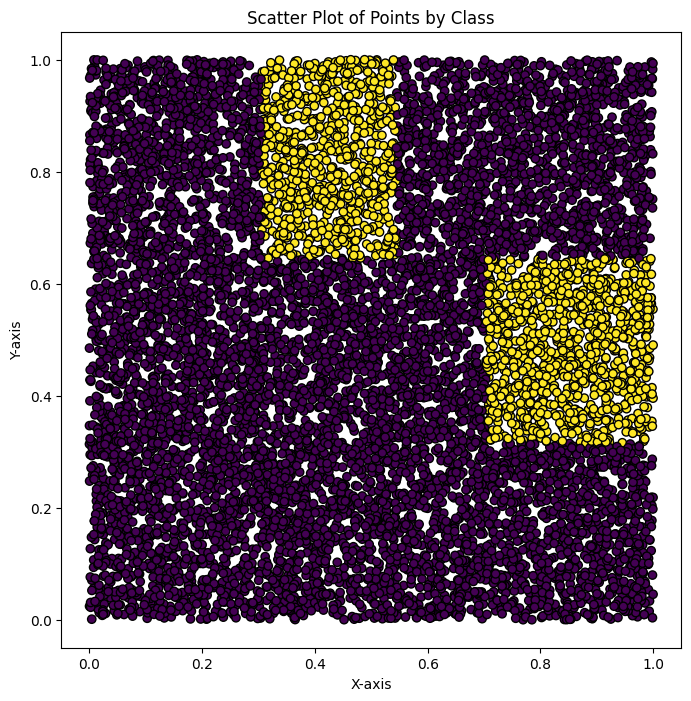

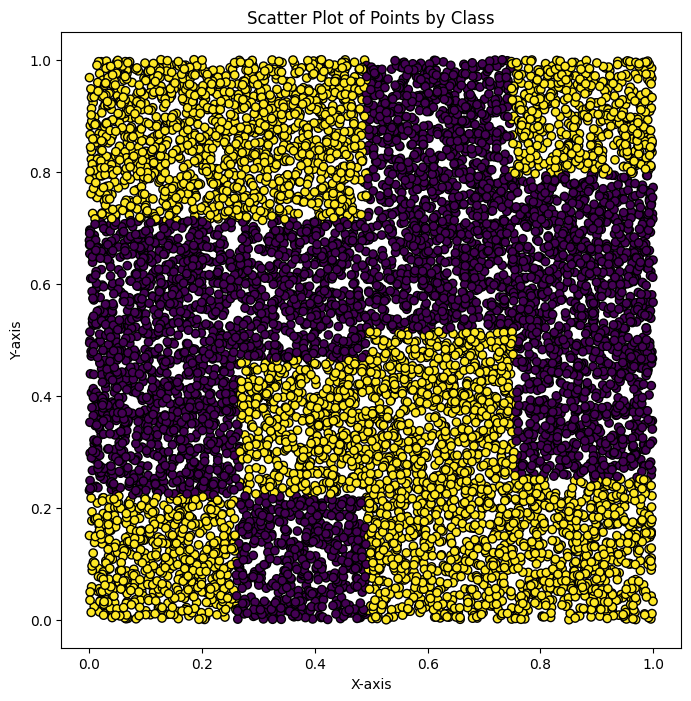

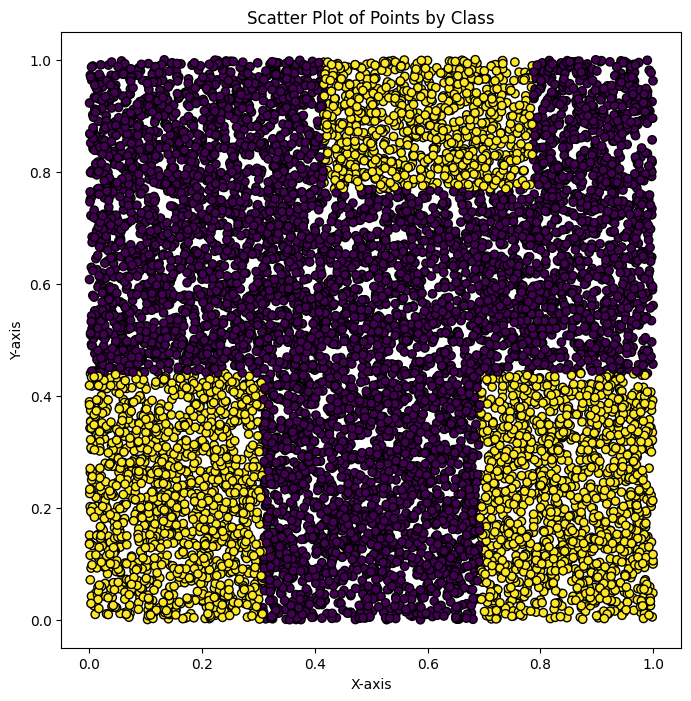

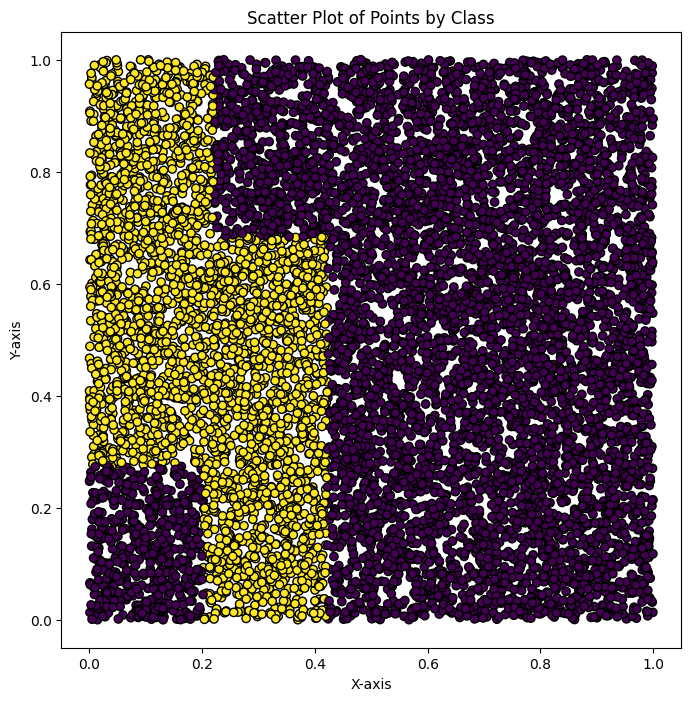

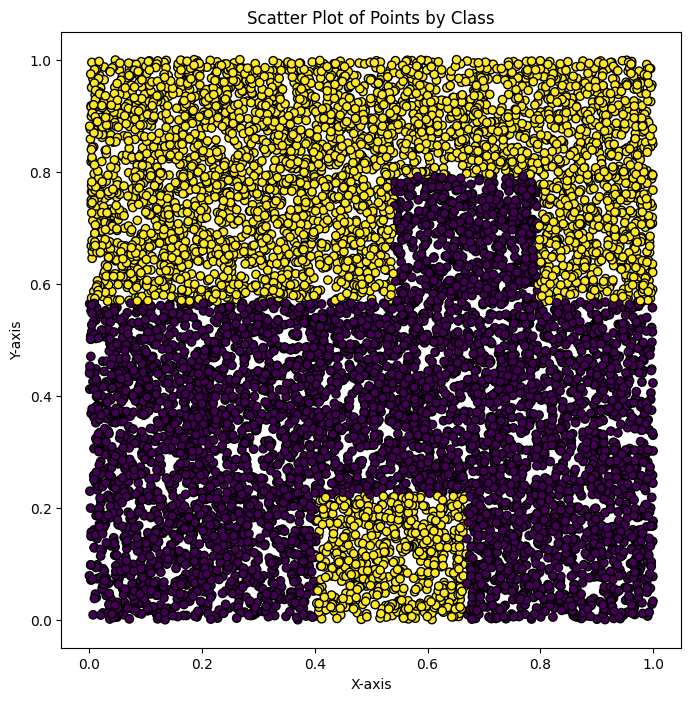

In [82]:
for i in range(10):
    draw_world_from_seed(i, 2, NUMBER_OF_CLASSES, endT = .2, endA = .1, max_depth = 4)

In [78]:
[l for l in learners]

[UncertainTreeLearner(min_samples_leaf=2min_samples_leaf=2,
                      ,
                      min_samples_split=4min_samples_split=4,
                      ,
                      sufficient_majority=0.9sufficient_majority=0.9),
 ClassificationTreeLearner(min_samples_leaf=2min_samples_leaf=2,
                           ,
                           min_samples_split=4min_samples_split=4,
                           ,
                           sufficient_majority=0.9sufficient_majority=0.9)]

In [25]:
# results[features][world_seed][errRange][n_sample][tree]
df = pd.DataFrame(results, columns=["Features", "World", "errRange", "n_samples", "skl", "post_hoc", "forest", "random_forest", "lasso", "ridge"])
# df.to_csv("results_10world.csv")

In [26]:
df_new = df.groupby(["Features", "errRange", "n_samples"]).agg({'skl':[np.mean,np.std],
                                                                'post_hoc':[np.mean,np.std],
                                                                'forest':[np.mean,np.std],
                                                                "random_forest":[np.mean,np.std],
                                                                "lasso":[np.mean,np.std],
                                                                "ridge":[np.mean,np.std]}).reset_index()

df_new

Features errRange n_samples        skl             post_hoc            \
                                      mean       std       mean       std   
0          1      0.0         5  89.282970  7.846154  89.282970  7.846154   
1          1      0.0        10  95.369818  2.913663  95.369818  2.913663   
2          1      0.0        20  97.720333  1.114412  97.720333  1.114412   
3          1      0.0        40  98.912152  0.467424  98.912152  0.467424   
4          1      0.1         5  86.571364  8.752029  86.694061  8.820802   
..       ...      ...       ...        ...       ...        ...       ...   
127        3      0.9        40  50.721303  2.657272  59.388152  6.728056   
128        3      1.0         5  53.848000  2.829923  55.910758  5.196915   
129        3      1.0        10  53.142576  2.900036  57.129273  5.662587   
130        3      1.0        20  51.154091  2.308083  57.954848  5.557414   
131        3      1.0        40  49.991000  2.210891  57.361485  6.875455   

        forest            random_forest                lasso             \
          mean        std          mean       std       mean        std   
0    90.211727   6.196922     88.751364  8.071772  45.225121  14.683260   
1    95.713182   2.207110     95.406455  2.509814  65.401909  23.094949   
2    97.615455   1.142174     97.541212  1.056288  70.602939  25.264359   
3    98.785303   0.570751     98.752909  0.548180  75.346879  22.349684   
4    87.308000   7.898010     86.658121  8.699124  45.498606  14.827796   
..         ...        ...           ...       ...        ...        ...   
127  64.566758  10.440037     53.336515  2.721735  71.196152  15.674133   
128  56.582182   6.425104     53.839758  3.316217  50.942424   9.529946   
129  58.777242   6.512204     53.797152  3.802385  57.216000   8.064449   
130  60.105758   8.955356     52.035242  2.449129  63.642000  13.100904   
131  62.774606   9.372134     52.111212  2.479515  70.405818  15.370555   

         ridge             
          mean        std  
0    74.287152  18.894777  
1    75.029030  19.771327  
2    74.855182  20.053933  
3    75.164576  20.552957  
4    74.383485  18.860693  
..         ...        ...  
127  72.371606  15.030658  
128  59.940182   7.744766  
129  63.525152  10.610227  
130  67.302333  13.232535  
131  71.737273  14.732002  

[132 rows x 15 columns]

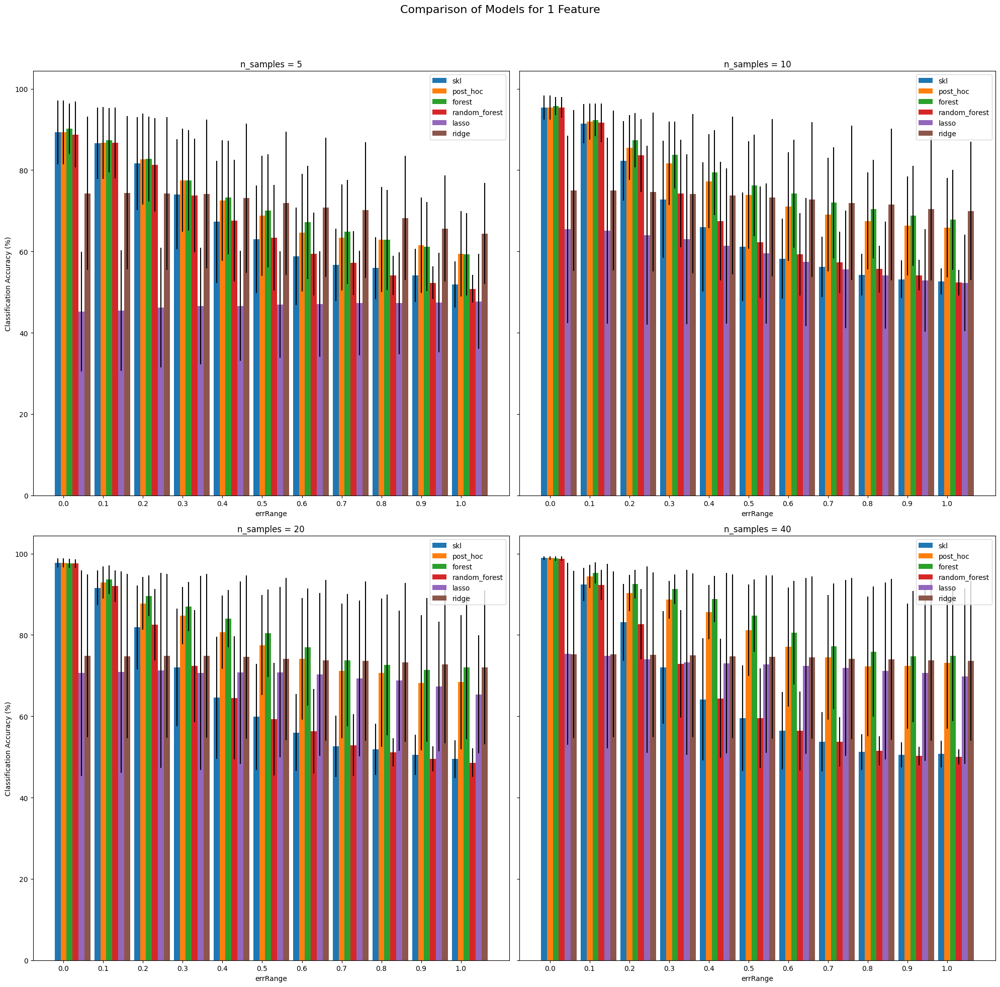

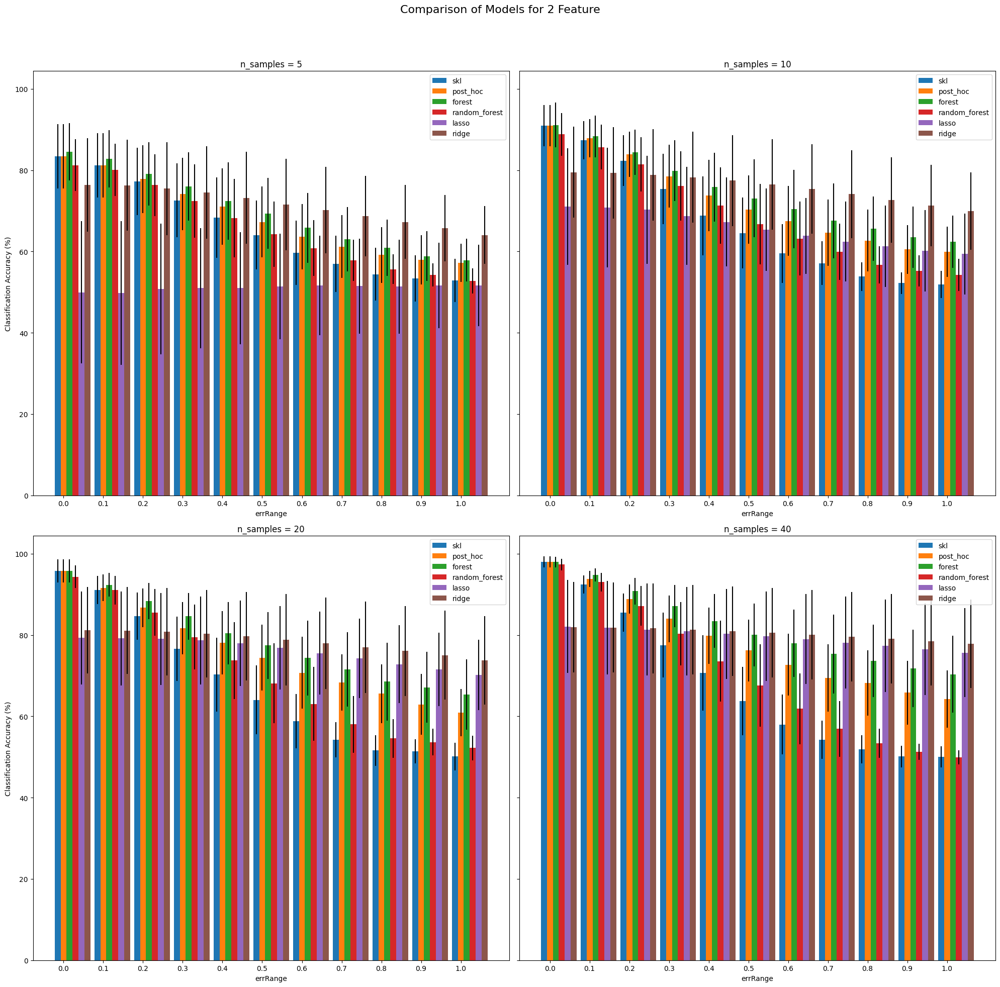

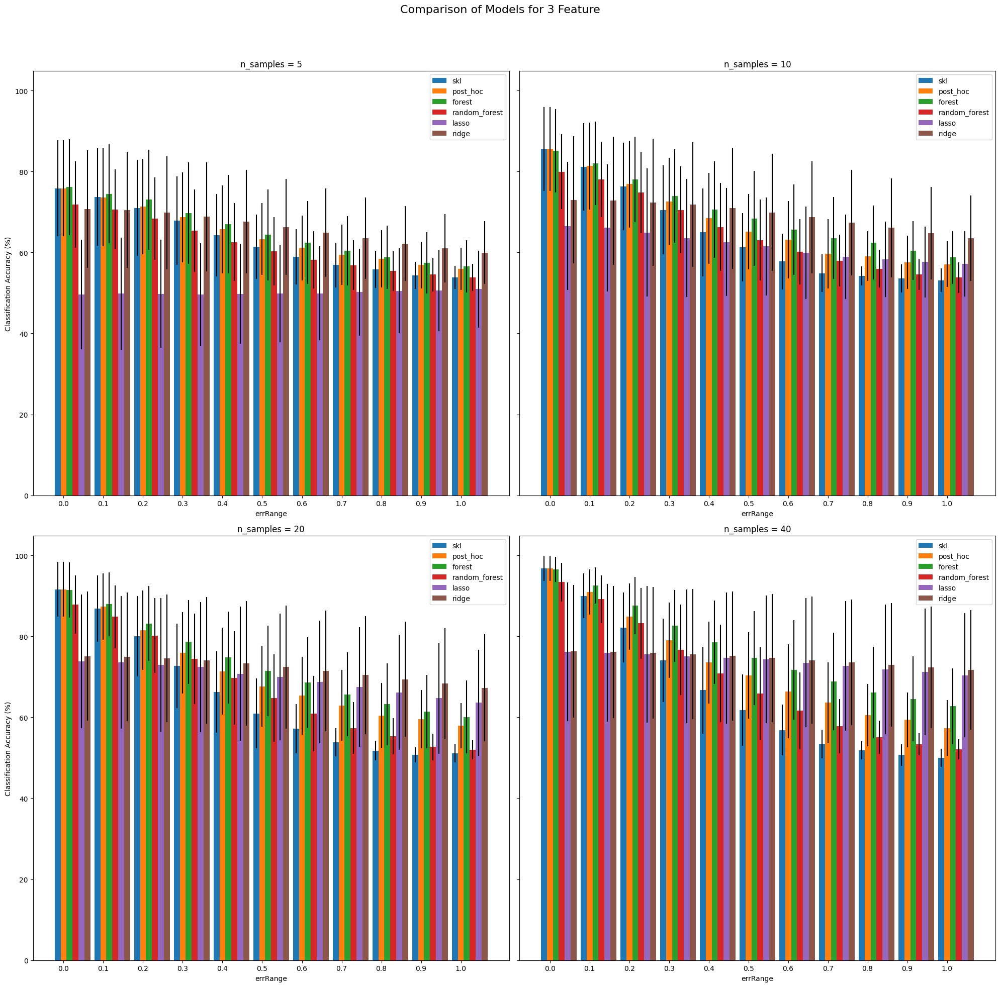

In [37]:
import numpy as np
import matplotlib.pyplot as plt

# Loop through each feature
for feature in df_new['Features'].unique():
    feature_data = df_new[df_new['Features'] == feature]

    # Create a figure with 4 subplots in a 2x2 grid
    fig, axes = plt.subplots(2, 2, figsize=(20, 20), sharey=True)
    fig.suptitle(f'Comparison of Models for {feature} Feature', fontsize=16)

    # Flatten axes array to easily iterate over it
    axes = axes.flatten()

    for i, samples in enumerate(n_sample):
        samples_data = feature_data[feature_data['n_samples'] == samples]

        # Prepare data for plotting
        x = samples_data['errRange']
        skl_means = samples_data[('skl', 'mean')]
        skl_stds = samples_data[('skl', 'std')]
        post_hoc_means = samples_data[('post_hoc', 'mean')]
        post_hoc_stds = samples_data[('post_hoc', 'std')]
        forest_means = samples_data[('forest', 'mean')]
        forest_stds = samples_data[('forest', 'std')]
        random_forest_means = samples_data[('random_forest', 'mean')]
        random_forest_stds = samples_data[('random_forest', 'std')]
        lasso_means = samples_data[('lasso', 'mean')]
        lasso_stds = samples_data[('lasso', 'std')]
        ridge_means = samples_data[('ridge', 'mean')]
        ridge_stds = samples_data[('ridge', 'std')]

        # Plotting
        bar_width = 0.15
        bar1 = np.arange(len(x))
        bar2 = [i + bar_width for i in bar1]
        bar3 = [i + bar_width for i in bar2]
        bar4 = [i + bar_width for i in bar3]
        bar5 = [i + bar_width for i in bar4]
        bar6 = [i + bar_width for i in bar5]

        axes[i].bar(bar1, skl_means, yerr=skl_stds, width=bar_width, label='skl')
        axes[i].bar(bar2, post_hoc_means, yerr=post_hoc_stds, width=bar_width, label='post_hoc')
        axes[i].bar(bar3, forest_means, yerr=forest_stds, width=bar_width, label='forest')
        axes[i].bar(bar4, random_forest_means, yerr=random_forest_stds, width=bar_width, label='random_forest')
        axes[i].bar(bar5, lasso_means, yerr=lasso_stds, width=bar_width, label='lasso')
        axes[i].bar(bar6, ridge_means, yerr=ridge_stds, width=bar_width, label='ridge')

        axes[i].set_xlabel('errRange')
        axes[i].set_title(f'n_samples = {samples}')
        axes[i].set_xticks([r + bar_width for r in range(len(x))])
        axes[i].set_xticklabels(x)
        axes[i].legend()

    # Set the label for the y-axis on the first plot
    axes[0].set_ylabel('Classification Accuracy (%)')
    axes[2].set_ylabel('Classification Accuracy (%)')

    # Adjust layout to prevent overlapping
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make room for the main title
    plt.show()


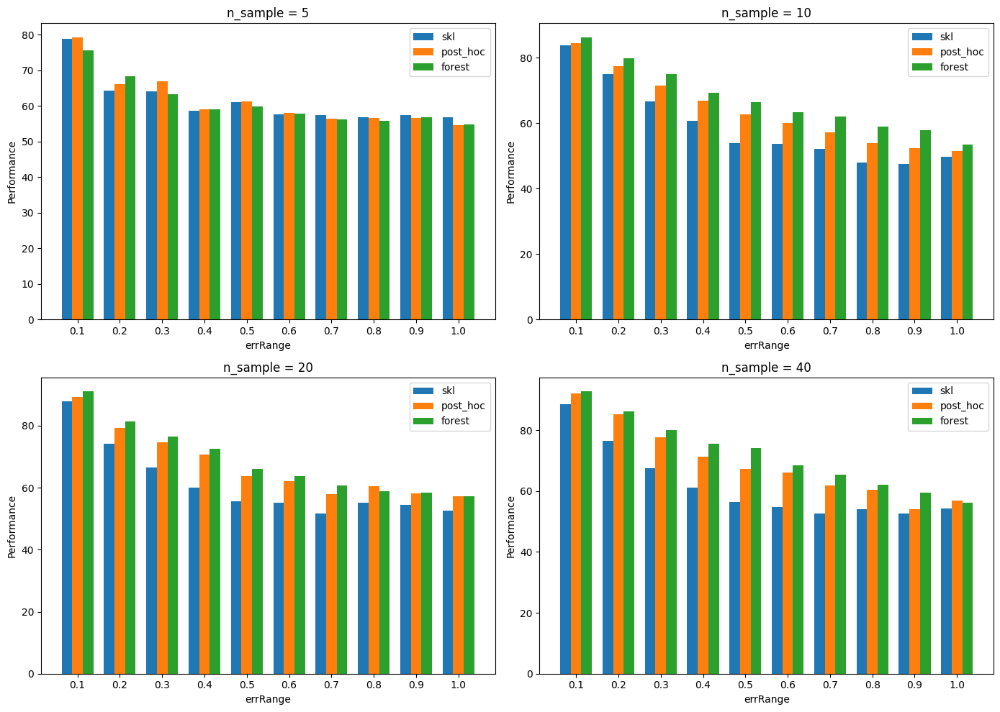

In [404]:
# Define n_samples to plot
n_samples_list = [5, 10, 20, 40]
err_ranges = np.arange(0.1, 1.1, 0.1)
models = ['skl', 'post_hoc', 'forest']

# Plotting
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

for i, n_samples in enumerate(n_samples_list):
    ax = axes[i]
    model_scores = {model: [] for model in models}

    for err_range in err_ranges:
        for model in models:
            model_scores[model].append(results[2][0][round(err_range, 1)][n_samples][model])

    # Plotting bar chart
    bar_width = 0.25
    index = np.arange(len(err_ranges))

    for j, model in enumerate(models):
        ax.bar(index + j * bar_width, model_scores[model], bar_width, label=model)

    ax.set_xlabel('errRange')
    ax.set_ylabel('Performance')
    ax.set_title(f'n_sample = {n_samples}')
    ax.set_xticks(index + bar_width)
    ax.set_xticklabels([f'{er:.1f}' for er in err_ranges])
    ax.legend()

plt.tight_layout()
plt.show()